In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Load the dataset
file_path = 'CC Clustering.csv'
data = pd.read_csv(file_path)

# Display the first few rows of the dataset
data.head()


/Users/ktlkr/opt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [4]:
# Handle missing values
# For simplicity, we can fill missing values with the mean of the respective columns
data.fillna(data.mean(), inplace=True)

# Drop the 'CUST_ID' column as it is not relevant for clustering
data.drop('CUST_ID', axis=1, inplace=True)

# Normalize the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

# Convert the scaled data back to a DataFrame
data_scaled = pd.DataFrame(data_scaled, columns=data.columns)

# Display the first few rows of the scaled data
data_scaled.head()


/var/folders/y_/4_ck1m5x1fx0g48d_82vflrc0000gn/T/ipykernel_4306/1253633452.py:3: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data.fillna(data.mean(), inplace=True)


,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,-0.731989,-0.249434,-0.424900,-0.356934,-0.349079,-0.466786,-0.806490,-0.678661,-0.707313,-0.675349,-0.476070,-0.511333,-0.960433,-0.528979,-3.109675e-01,-0.525551,0.36068
1,0.786961,0.134325,-0.469552,-0.356934,-0.454576,2.605605,-1.221758,-0.678661,-0.916995,0.573963,0.110074,-0.591796,0.688639,0.818642,8.931021e-02,0.234227,0.36068
2,0.447135,0.518084,-0.107668,0.108889,-0.454576,-0.466786,1.269843,2.673451,-0.916995,-0.675349,-0.476070,-0.109020,0.826062,-0.383805,-1.016632e-01,-0.525551,0.36068
3,0.049099,-1.016953,0.232058,0.546189,-0.454576,-0.368653,-1.014125,-0.399319,-0.916995,-0.258913,-0.329534,-0.551565,0.826062,-0.598688,-4.390474e-16,-0.525551,0.36068
4,-0.358775,0.518084,-0.462063,-0.347294,-0.454576,-0.466786,-1.014125,-0.399319,-0.916995,-0.675349,-0.476070,-0.551565,-0.905464,-0.364368,-2.657913e-01,-0.525551,0.36068


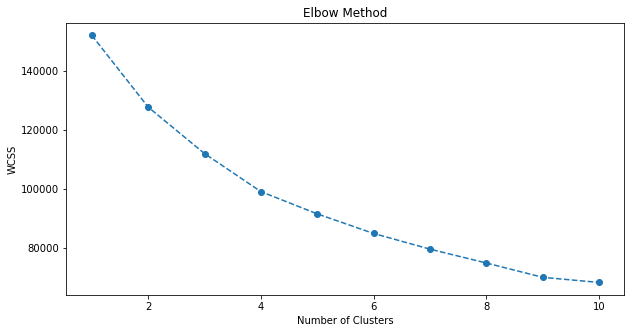

In [6]:
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(data_scaled)
    wcss.append(kmeans.inertia_)

# Plot the Elbow Method graph
plt.figure(figsize=(10, 5))
plt.plot(range(1, 11), wcss, marker='o', linestyle='--')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()


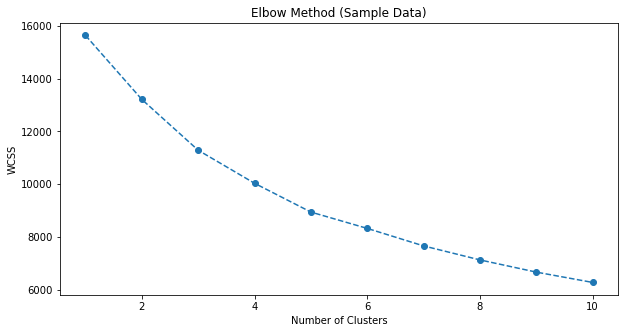

In [8]:
# Sample a smaller portion of the data
sample_data = data_scaled.sample(frac=0.1, random_state=42)

# Determine the optimal number of clusters using the Elbow Method on the sample data
wcss_sample = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(sample_data)
    wcss_sample.append(kmeans.inertia_)

# Plot the Elbow Method graph
plt.figure(figsize=(10, 5))
plt.plot(range(1, 11), wcss_sample, marker='o', linestyle='--')
plt.title('Elbow Method (Sample Data)')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()


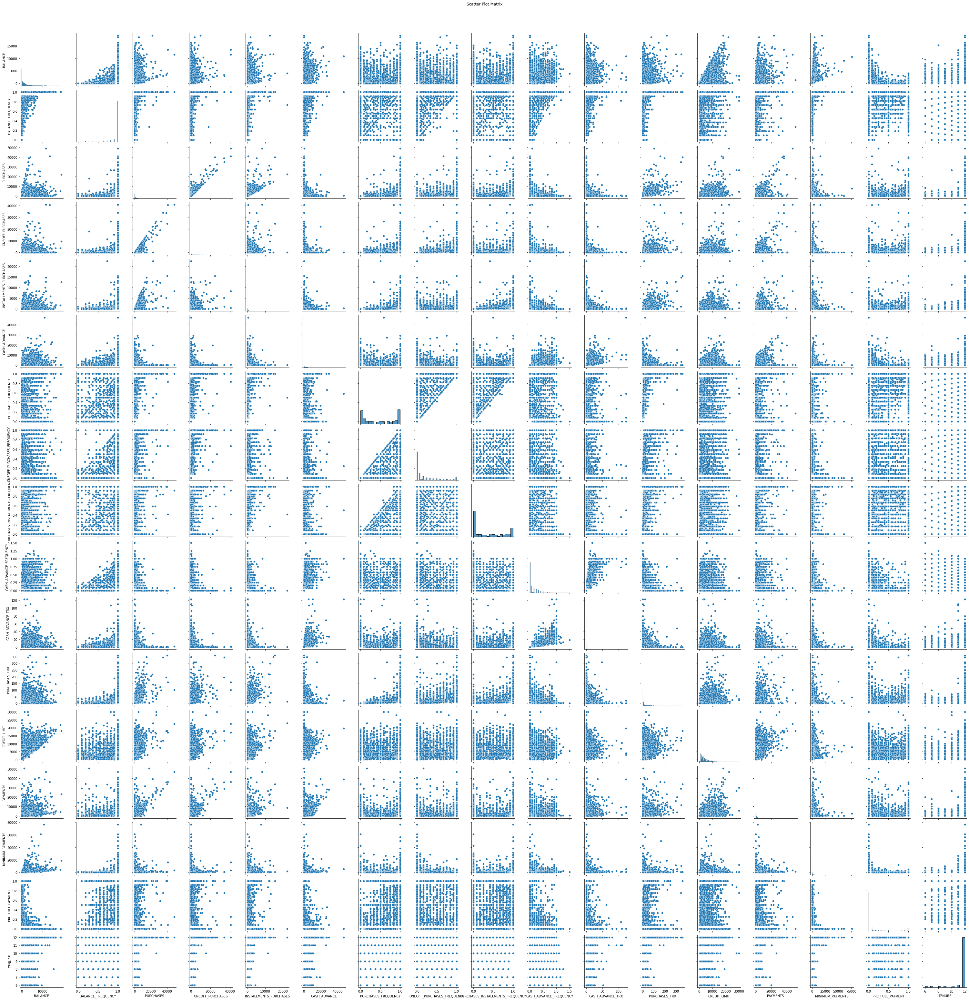

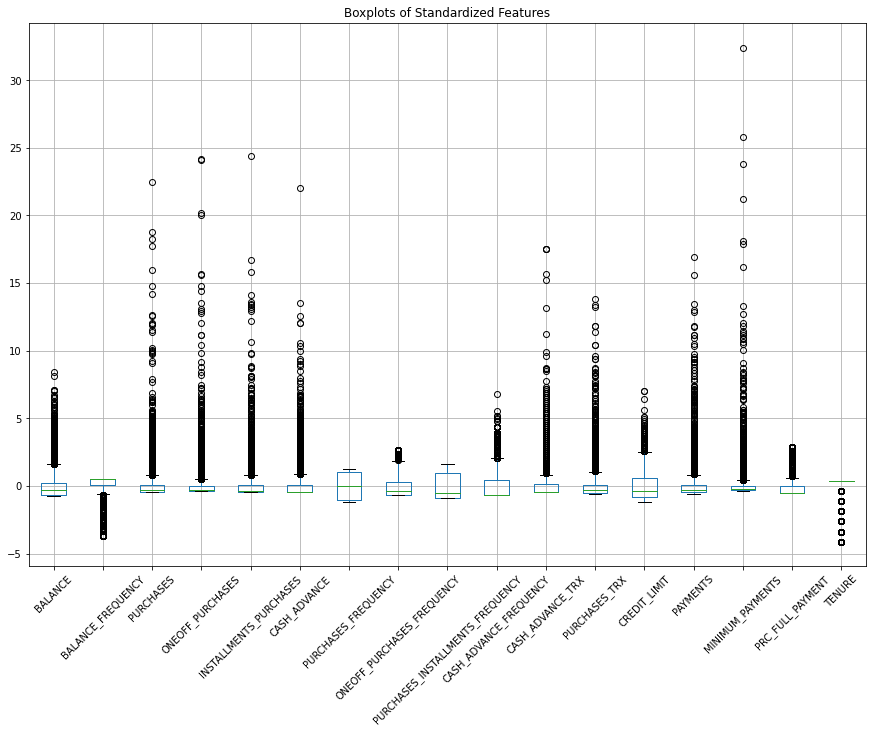

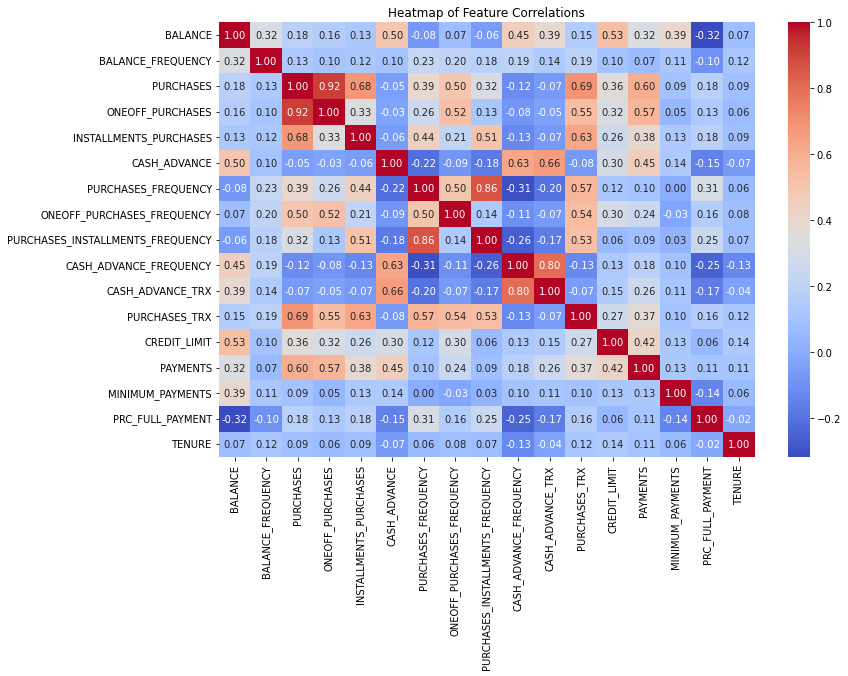

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt

# Scatter plot matrix
sns.pairplot(data)
plt.suptitle('Scatter Plot Matrix', y=1.02)
plt.show()

# Boxplots for each feature
data_scaled.boxplot(figsize=(15,10), rot=45)
plt.title('Boxplots of Standardized Features')
plt.show()

# Heatmap of feature correlations
plt.figure(figsize=(12, 8))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Heatmap of Feature Correlations')
plt.show()


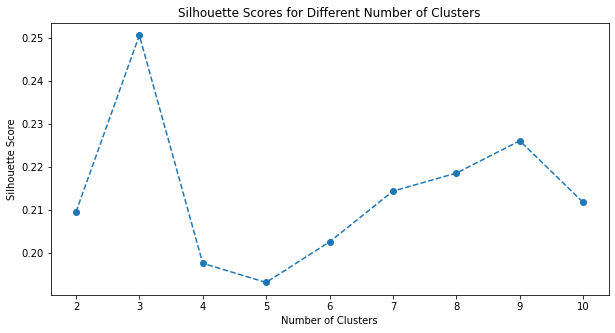

In [11]:
from sklearn.metrics import silhouette_score

# Elbow Method (already implemented before)
# ...

# Silhouette Score for different values of K
silhouette_scores = []
for i in range(2, 11):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(data_scaled)
    score = silhouette_score(data_scaled, kmeans.labels_)
    silhouette_scores.append(score)

# Plot Silhouette Scores
plt.figure(figsize=(10, 5))
plt.plot(range(2, 11), silhouette_scores, marker='o', linestyle='--')
plt.title('Silhouette Scores for Different Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.show()


In [13]:
# Implementing K-Means with the chosen parameters
optimal_k = 3  # This should be determined from the Elbow Method or Silhouette Score
kmeans = KMeans(n_clusters=optimal_k, init='k-means++', random_state=42)
kmeans.fit(data_scaled)

# Adding cluster labels to the dataset
data['Cluster'] = kmeans.labels_

# Evaluate the clustering
inertia = kmeans.inertia_
silhouette = silhouette_score(data_scaled, kmeans.labels_)

print(f'Optimal K: {optimal_k}')
print(f'Inertia: {inertia}')
print(f'Silhouette Score: {silhouette}')


Optimal K: 3
Inertia: 111986.74707959313
Silhouette Score: 0.2505299806322502


             BALANCE  BALANCE_FREQUENCY    PURCHASES  ONEOFF_PURCHASES  \
Cluster                                                                  
0         799.771040           0.835184   505.615025        253.161504   
1        3987.067263           0.957917   384.287495        248.562392   
2        2220.003291           0.981477  4268.520980       2717.828543   

         INSTALLMENTS_PURCHASES  CASH_ADVANCE  PURCHASES_FREQUENCY  \
Cluster                                                              
0                    252.774371    329.805632             0.465148   
1                    135.802542   3867.874441             0.232145   
2                   1551.178267    458.421147             0.949093   

         ONEOFF_PURCHASES_FREQUENCY  PURCHASES_INSTALLMENTS_FREQUENCY  \
Cluster                                                                 
0                          0.132355                          0.345201   
1                          0.110873                        

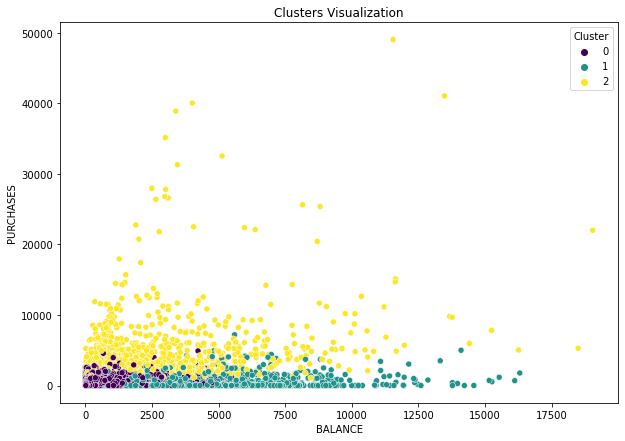

In [16]:
# Cluster Analysis
cluster_summary = data.groupby('Cluster').mean()
print(cluster_summary)

# Visualizing clusters
plt.figure(figsize=(10, 7))
sns.scatterplot(data=data, x='BALANCE', y='PURCHASES', hue='Cluster', palette='viridis')
plt.title('Clusters Visualization')
plt.show()


In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score



In [20]:
file_path = 'CC Clustering.csv'
data = pd.read_csv(file_path)


In [22]:
# Handle missing values by filling them with the mean of the respective columns
data.fillna(data.mean(), inplace=True)

# Drop the 'CUST_ID' column as it is not relevant for clustering
data.drop('CUST_ID', axis=1, inplace=True)

# Standardize the features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

# Convert the scaled data back to a DataFrame
data_scaled = pd.DataFrame(data_scaled, columns=data.columns)


/var/folders/y_/4_ck1m5x1fx0g48d_82vflrc0000gn/T/ipykernel_4306/3193425684.py:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data.fillna(data.mean(), inplace=True)


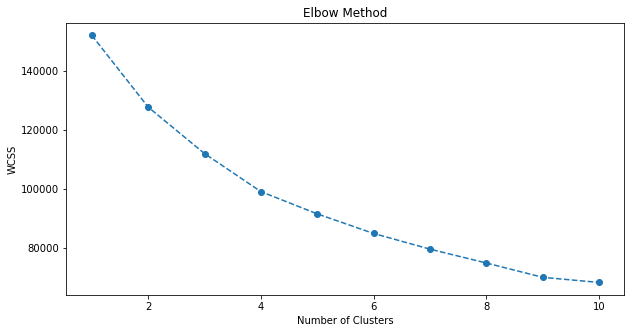

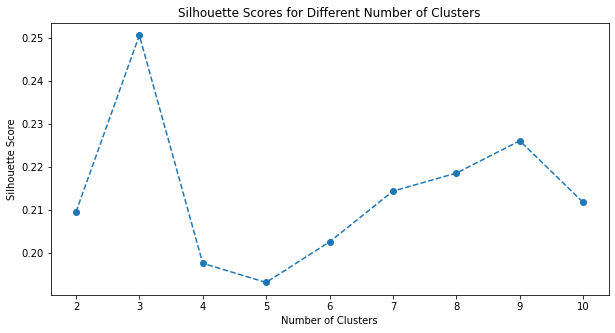

In [24]:
# Elbow Method
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(data_scaled)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(10, 5))
plt.plot(range(1, 11), wcss, marker='o', linestyle='--')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

# Silhouette Score
silhouette_scores = []
for i in range(2, 11):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(data_scaled)
    score = silhouette_score(data_scaled, kmeans.labels_)
    silhouette_scores.append(score)

plt.figure(figsize=(10, 5))
plt.plot(range(2, 11), silhouette_scores, marker='o', linestyle='--')
plt.title('Silhouette Scores for Different Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.show()


In [26]:
init_method = 'k-means++'


In [28]:
optimal_k = 3  # This should be determined from the Elbow Method or Silhouette Score
kmeans = KMeans(n_clusters=optimal_k, init=init_method, random_state=42)


In [30]:
kmeans.fit(data_scaled)
data['Cluster'] = kmeans.labels_


In [32]:
cluster_centers = kmeans.cluster_centers_
print("Cluster Centers:")
print(cluster_centers)


Cluster Centers:
[[-0.36746916 -0.17743588 -0.2327288  -0.20431765 -0.17481459 -0.30956181
  -0.06236032 -0.23477205 -0.04796574 -0.33429492 -0.29883798 -0.24340059
  -0.33599682 -0.2843804  -0.13548126  0.00749457 -0.02808123]
 [ 1.16146264  0.34032506 -0.29046365 -0.20746781 -0.30570882  1.37785776
  -0.64454468 -0.30711924 -0.55563023  1.55907756  1.33983706 -0.36762478
   0.5993495   0.44330141  0.39884679 -0.4100761  -0.12671273]
 [ 0.32027299  0.43982886  1.52988676  1.28163909  1.26237969 -0.24679312
   1.14289991  1.56156181  0.9565123  -0.35851122 -0.2508035   1.68261002
   0.89119831  0.83703323  0.1560663   0.49320477  0.30315287]]


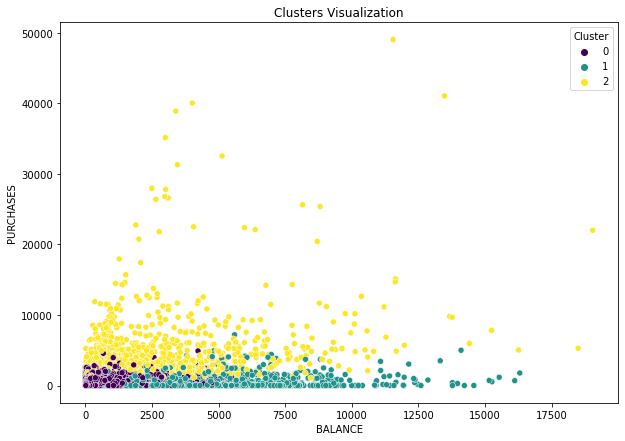

In [34]:
plt.figure(figsize=(10, 7))
sns.scatterplot(data=data, x='BALANCE', y='PURCHASES', hue='Cluster', palette='viridis')
plt.title('Clusters Visualization')
plt.show()


In [36]:
inertia = kmeans.inertia_
silhouette = silhouette_score(data_scaled, kmeans.labels_)

print(f'Inertia: {inertia}')
print(f'Silhouette Score: {silhouette}')


Inertia: 111986.74707959313
Silhouette Score: 0.2505299806322502


In [38]:
cluster_summary = data.groupby('Cluster').mean()
print(cluster_summary)


             BALANCE  BALANCE_FREQUENCY    PURCHASES  ONEOFF_PURCHASES  \
Cluster                                                                  
0         799.771040           0.835184   505.615025        253.161504   
1        3987.067263           0.957917   384.287495        248.562392   
2        2220.003291           0.981477  4268.520980       2717.828543   

         INSTALLMENTS_PURCHASES  CASH_ADVANCE  PURCHASES_FREQUENCY  \
Cluster                                                              
0                    252.774371    329.805632             0.465148   
1                    135.802542   3867.874441             0.232145   
2                   1551.178267    458.421147             0.949093   

         ONEOFF_PURCHASES_FREQUENCY  PURCHASES_INSTALLMENTS_FREQUENCY  \
Cluster                                                                 
0                          0.132355                          0.345201   
1                          0.110873                        

In [40]:
# Example: Filtering outliers based on a threshold
outliers = data[data['BALANCE'] > data['BALANCE'].quantile(0.95)]
print("Outliers:")
print(outliers)


Outliers:
           BALANCE  BALANCE_FREQUENCY  PURCHASES  ONEOFF_PURCHASES  \
15     6886.213231           1.000000    1611.70              0.00   
21     6369.531318           1.000000    6359.95           5910.04   
28     7152.864372           1.000000     387.05            204.55   
30    12136.219960           1.000000    3038.01           1013.20   
32     6732.823064           1.000000     324.95            324.95   
...            ...                ...        ...               ...   
8151   7215.195760           1.000000       0.00              0.00   
8309   6008.914524           0.777778       0.00              0.00   
8411   5934.610587           1.000000       0.00              0.00   
8705   7302.672686           1.000000       0.00              0.00   
8941   5967.475270           0.833333     214.55              0.00   

      INSTALLMENTS_PURCHASES  CASH_ADVANCE  PURCHASES_FREQUENCY  \
15                   1611.70   2301.491267             0.500000   
21             

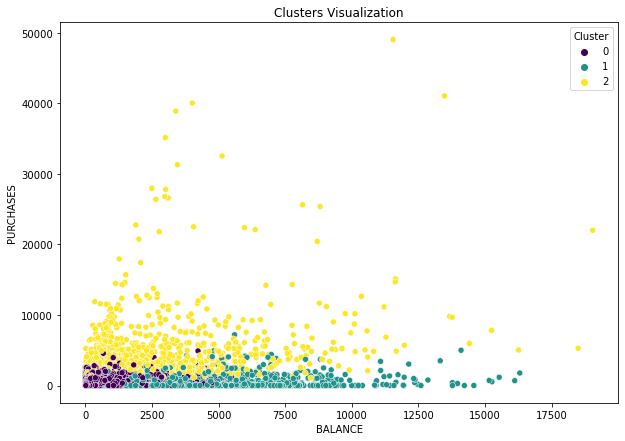

In [42]:
plt.figure(figsize=(10, 7))
sns.scatterplot(data=data, x='BALANCE', y='PURCHASES', hue='Cluster', palette='viridis')
plt.title('Clusters Visualization')
plt.show()


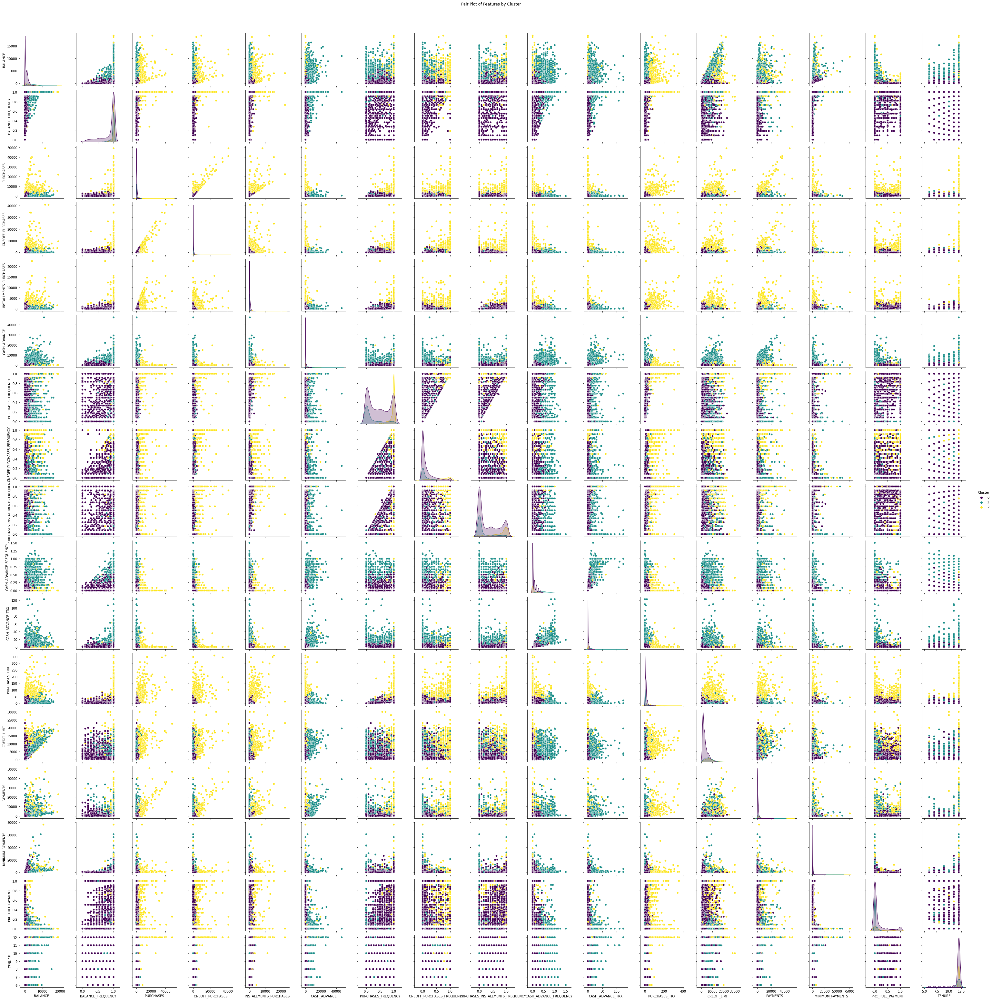

In [44]:
sns.pairplot(data, hue='Cluster', palette='viridis')
plt.suptitle('Pair Plot of Features by Cluster', y=1.02)
plt.show()


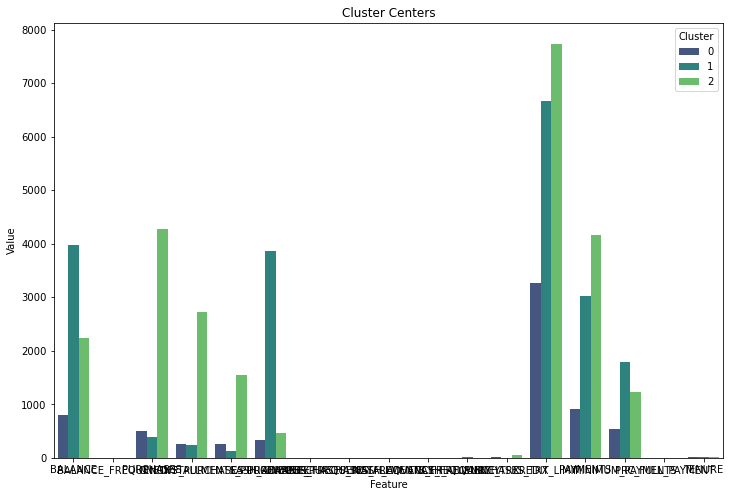

In [45]:
cluster_centers = pd.DataFrame(scaler.inverse_transform(kmeans.cluster_centers_), columns=data.columns[:-1])
cluster_centers['Cluster'] = range(optimal_k)

cluster_centers_melted = pd.melt(cluster_centers, id_vars='Cluster', var_name='Feature', value_name='Value')

plt.figure(figsize=(12, 8))
sns.barplot(data=cluster_centers_melted, x='Feature', y='Value', hue='Cluster', palette='viridis')
plt.title('Cluster Centers')
plt.show()


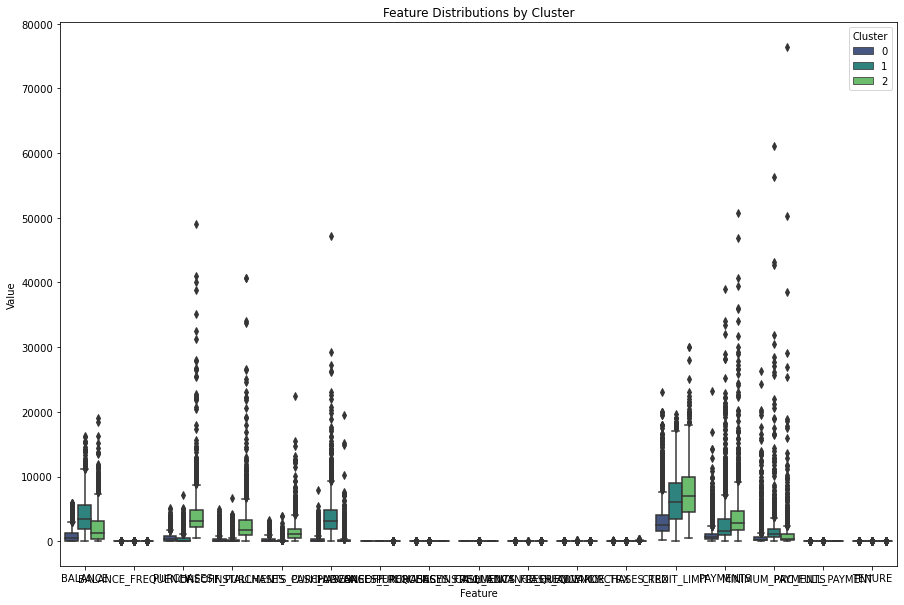

In [46]:
plt.figure(figsize=(15, 10))
data_melted = pd.melt(data, id_vars='Cluster', var_name='Feature', value_name='Value')
sns.boxplot(data=data_melted, x='Feature', y='Value', hue='Cluster', palette='viridis')
plt.title('Feature Distributions by Cluster')
plt.show()


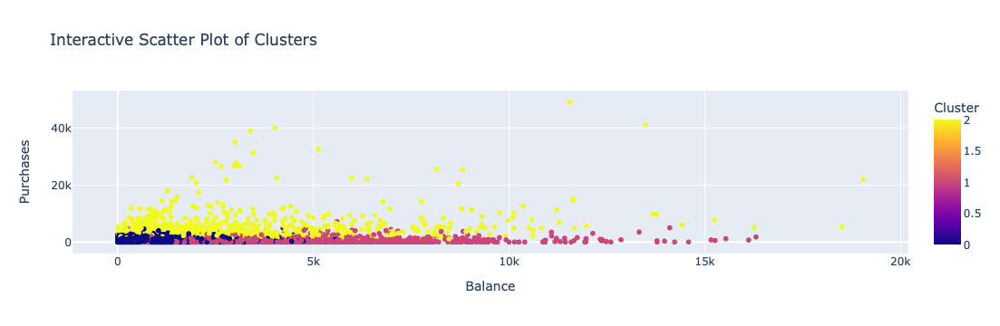

In [47]:
import plotly.express as px

fig = px.scatter(data, x='BALANCE', y='PURCHASES', color='Cluster', 
                 title='Interactive Scatter Plot of Clusters',
                 labels={'BALANCE':'Balance', 'PURCHASES':'Purchases'})
fig.show()


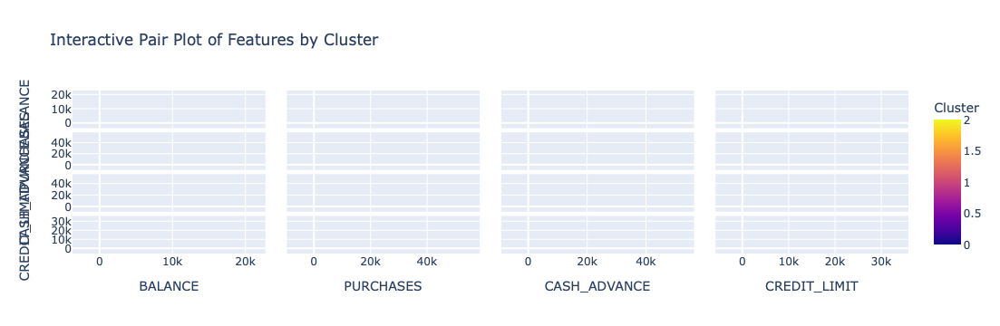

In [48]:
fig = px.scatter_matrix(data, dimensions=['BALANCE', 'PURCHASES', 'CASH_ADVANCE', 'CREDIT_LIMIT'], color='Cluster', 
                        title='Interactive Pair Plot of Features by Cluster')
fig.show()


In [54]:
import dash
import dash_core_components as dcc
import dash_html_components as html
from dash.dependencies import Input, Output

app = dash.Dash(__name__)

app.layout = html.Div([
    html.H1("K-Means Clustering Dashboard"),
    dcc.Graph(id='scatter-plot', 
              figure=px.scatter(data, x='BALANCE', y='PURCHASES', color='Cluster', 
                                title='Interactive Scatter Plot of Clusters',
                                labels={'BALANCE':'Balance', 'PURCHASES':'Purchases'})),
    dcc.Graph(id='pair-plot', 
              figure=px.scatter_matrix(data, dimensions=['BALANCE', 'PURCHASES', 'CASH_ADVANCE', 'CREDIT_LIMIT'], color='Cluster', 
                                       title='Interactive Pair Plot of Features by Cluster'))
])

if __name__ == '__main__':
    app.run_server(debug=True)


/var/folders/y_/4_ck1m5x1fx0g48d_82vflrc0000gn/T/ipykernel_4306/654259569.py:2: UserWarning:


The dash_core_components package is deprecated. Please replace
`import dash_core_components as dcc` with `from dash import dcc`

/var/folders/y_/4_ck1m5x1fx0g48d_82vflrc0000gn/T/ipykernel_4306/654259569.py:3: UserWarning:


The dash_html_components package is deprecated. Please replace
`import dash_html_components as html` with `from dash import html`

